In [1]:
import torch 
from torch import nn
import matplotlib.pyplot as plt


from rbi.utils.nets import CategoricalNet
from rbi.loss.loss_fn import NLLLoss
from rbi.defenses.regularized_loss import GaussianNoiseJacobiRegularizer, WorstCaseJacobiRegularizer
from rbi.utils.datasets import get_datasets
from rbi.visualization.surface_plots import plot_2d_surface_direction

import numpy as np 
from torchvision.utils import make_grid as make_image_grid

torch.manual_seed(0)

In [2]:
train_loader, test_loader = get_datasets("mnist")

In [3]:
net1 = CategoricalNet(784, 10, hidden_dims=[512, 256, 128], prediction_fn="argmax",input_transform = lambda x: x.reshape(-1, 784))
loss_fn = NLLLoss(net1)

In [4]:
optim = torch.optim.Adam(net1.parameters(), lr=5e-3)
for i in range(10):
    for X,y in train_loader:
        optim.zero_grad()
        loss = loss_fn(X, y)
        loss.backward()
        optim.step()
    print(loss.detach())

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


tensor(0.0619)
tensor(0.1501)
tensor(0.0910)
tensor(0.1261)
tensor(0.0213)
tensor(0.0029)
tensor(0.0472)
tensor(0.0317)
tensor(0.0086)
tensor(0.0228)


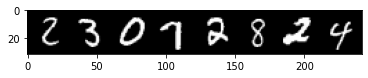

In [5]:
plt.imshow(np.transpose(make_image_grid(X[:8]).numpy(), (1,2,0)))

In [6]:
defense = GaussianNoiseJacobiRegularizer(net1, loss_fn, 0.5)
F = defense._compute_fisher(X[:8].reshape(8,-1), net1(X[:8]))

In [7]:
diag_Fisher = torch.diagonal(F,dim1=-2, dim2=-1)
diag_Fisher = diag_Fisher/diag_Fisher.max(-1).values.unsqueeze(-1)

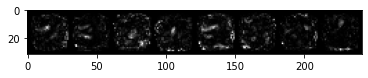

In [8]:
plt.imshow(np.transpose(make_image_grid(diag_Fisher.detach().reshape(8,1,28,28)).numpy(), (1,2,0)))

In [9]:
tests = X[:8]

In [180]:
from rbi.attacks.advertorch_attack import L2PGDAttack
from rbi.attacks.custom_attacks import SpectralKLAttack
from rbi.loss.loss_fn import ForwardKLLoss

adversarial_loss = ForwardKLLoss()
attack1 = L2PGDAttack(net1, adversarial_loss, eps=1., nb_iter=1000, clip_min=0., clip_max=1.)
attack2 = SpectralKLAttack(net1, eps=3., clip_min=0., clip_max=1.)

In [181]:
x_pert = attack1.perturb(tests.reshape(-1, 784))


tensor([8, 8, 0, 3, 8, 8, 2, 9])


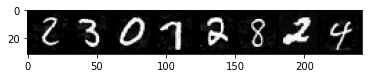

In [182]:
plt.imshow(np.transpose(make_image_grid(x_pert.reshape(-1,1, 28, 28)).numpy(), (1,2,0)))
print(net1.predict(x_pert.reshape(8, 784)))

In [188]:
x_pert = attack2.perturb(tests.reshape(-1, 784), eigendirection=-1)

tensor([2, 3, 0, 8, 8, 3, 2, 4])


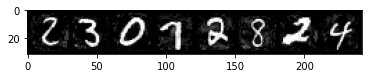

In [189]:
plt.imshow(np.transpose(make_image_grid(x_pert.reshape(-1,1, 28, 28)).numpy(), (1,2,0)))
print(net1.predict(x_pert.reshape(8, 784)))

In [146]:
# Iterative
def plot_eigendirection_loss_increase(index=-1):
    x_pert_iter = tests.reshape(-1, 784)
    a = SpectralKLAttack(net1, clip_min=0., clip_max=1.)
    lam, vs = a._get_kl_matrix_eigendecomposition(x_pert_iter, net1(x_pert_iter))
    v = vs[..., index]

    t = torch.linspace(0.000001, 3., 100)
    line_search = t.reshape(-1, 1, 1)*v.unsqueeze(0)

    out_test = net1(tests.reshape(-1, 784).repeat(100, 1))
    out_line = net1(tests.reshape(-1, 784).repeat(100, 1) + line_search.reshape(-1, 784))
    l = ForwardKLLoss(reduction=None)
    o = l(out_test, out_line).detach().reshape(100, 8)

    for i in range(8):
        plt.plot(t, o[:, i])

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


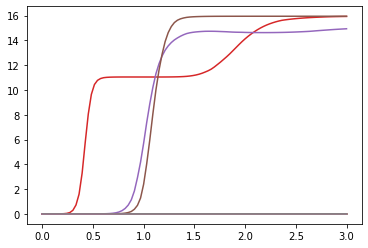

In [147]:
plot_eigendirection_loss_increase(-1)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


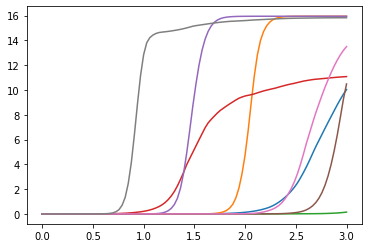

In [148]:
plot_eigendirection_loss_increase(-2)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


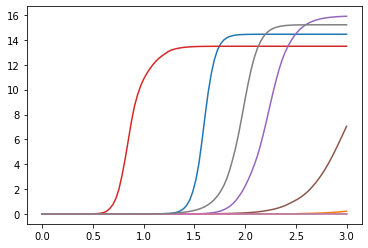

In [149]:
plot_eigendirection_loss_increase(-3)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


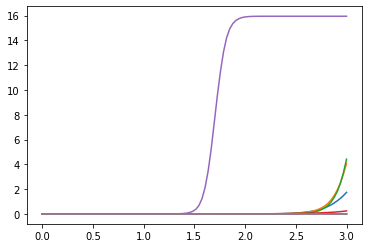

In [150]:
plot_eigendirection_loss_increase(-4)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


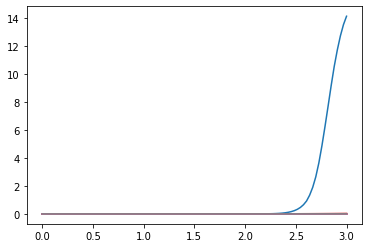

In [151]:
plot_eigendirection_loss_increase(-5)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


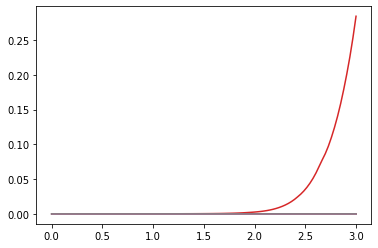

In [152]:
plot_eigendirection_loss_increase(-6)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


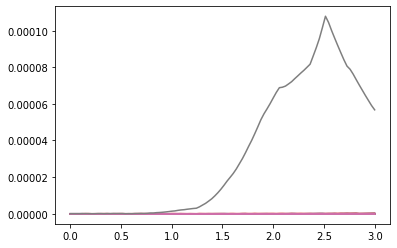

In [153]:
plot_eigendirection_loss_increase(-10)

In [63]:
torch.linalg.norm(x_pert_iter - tests.reshape(-1, 784), dim=-1)

tensor([   nan, 2.1579, 2.2715, 2.2896, 1.2618, 2.5593, 1.4318, 2.5544],
       grad_fn=<CopyBackwards>)

tensor([0, 3, 0, 9, 2, 9, 2, 6])


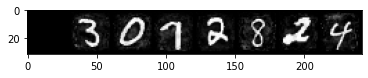

In [64]:
plt.imshow(np.transpose(make_image_grid(x_pert_iter.reshape(-1,1, 28, 28)).numpy(), (1,2,0)))
print(net1.predict(x_pert_iter.reshape(8, 784)))

In [34]:
net2 = CategoricalNet(784, 10, hidden_dims=[512, 256, 128], prediction_fn="argmax",input_transform = lambda x: x.reshape(-1, 784))
loss_fn = NLLLoss(net2)
defense = GaussianNoiseJacobiRegularizer(net2, loss_fn, 0.5)
defense.activate(algorithm="jvp_mc_approx", mc_samples=10)

In [35]:
optim = torch.optim.Adam(net2.parameters(), lr=5e-3)
for i in range(10):
    for X,y in train_loader:
        optim.zero_grad()
        X = X.reshape(-1, 784)
        loss = loss_fn(X, y)
        loss.backward()
        optim.step()
    print(loss.detach())

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


tensor(0.3518)
tensor(0.2333)
tensor(0.4362)
tensor(0.1783)
tensor(0.1172)
tensor(0.1719)
tensor(0.1888)
tensor(0.1204)
tensor(0.1454)
tensor(0.0994)


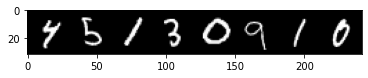

In [38]:
plt.imshow(np.transpose(make_image_grid(X[:8].reshape(8,1, 28,28)).numpy(), (1,2,0)))

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


In [40]:
F = defense._compute_fisher(X[:8].reshape(8,-1), net1(X[:8]))
diag_Fisher = torch.diagonal(F,dim1=-2, dim2=-1)
diag_Fisher = diag_Fisher/diag_Fisher.max(-1).values.unsqueeze(-1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


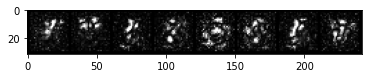

In [43]:
plt.imshow(np.transpose(make_image_grid(2*diag_Fisher.detach().reshape(8,1,28,28)).numpy(), (1,2,0)))

In [99]:
torch.save(net1.net, "data/mnist_net1.pkl")
torch.save(net2.net, "data/mnist_net2.pkl")

In [5]:
net1.net = torch.load("data/mnist_net1.pkl")
net2.net = torch.load("data/mnist_net2.pkl")

In [6]:
from rbi.attacks.advertorch_attack import GradientAttack, L2PGDAttack
from rbi.metrics.empirical_metrics import EmpiricalLossMetric

In [7]:
net1.predict = lambda x: net1.predict(x.reshape(-1, 784))
net2.predict = lambda x: net2.predict(x.reshape(-1, 784))

net1.mode="params"
net2.mode ="params"

In [8]:
attack = L2PGDAttack(net1, loss_fn._loss, eps=0.5, clip_min=0, clip_max=1)
metric = EmpiricalLossMetric(net1, attack, loss_fn)
clean_loss1 = metric.eval_clean(test_loader)
perturbed_loss1 = metric.eval_perturbed(test_loader)

attack = L2PGDAttack(net2, loss_fn._loss, eps=0.5, clip_min=0, clip_max=1)
metric = EmpiricalLossMetric(net2, attack, loss_fn)
clean_loss2 = metric.eval_clean(test_loader)
perturbed_loss2 = metric.eval_perturbed(test_loader)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


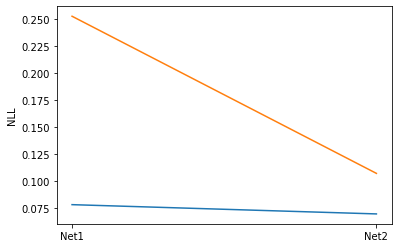

In [9]:
with torch.no_grad():
    plt.plot(["Net1", "Net2"], [clean_loss1, clean_loss2])
    plt.plot(["Net1", "Net2"], [perturbed_loss1, perturbed_loss2])
    plt.ylabel("NLL")

In [66]:
def plot_2d_surface_direction(net, origin, direction1, direction2, x_min:float=-5., x_max:float=5., y_min:float=-5, y_max:float=5., steps: int=1000, cmap="viridis", figsize=(50,10), z_lim_min=0., z_lim_max=1.):
    assert direction1.shape[0] == 1, "The direction should be a (1, input_dim) vector"
    assert len(direction1.shape) == 2, "The direction should be a (1, input_dim) vector"
    assert origin.shape == direction1.shape and origin.shape == direction2.shape
    with torch.no_grad():
        xx = torch.linspace(x_min,x_max, steps)
        yy = torch.linspace(y_min,y_max, steps)
        XX, YY = torch.meshgrid(xx,yy)

        scales_x, scales_y = XX.reshape(-1,1), YY.reshape(-1,1)
        inputs = origin + direction1*scales_x + direction2*scales_y
        cs = net.net(inputs)
        output_dim = cs.shape[-1]
        fig, axes = plt.subplots(1,output_dim,figsize=figsize,subplot_kw=dict(projection='3d'))

        for i, ax in enumerate(axes):
            c = cs[..., i].reshape(steps, steps)
            ax.plot_surface(XX,YY, c, cmap=cmap, linewidth=0, antialiased=False, vmin=z_lim_min, vmax=z_lim_max)
            ax.grid(False)
            ax.set_zlim(z_lim_min,z_lim_max)

    return fig, inputs, cs

In [73]:

dir1 =  torch.randn(1, 784)
dir1 /= torch.linalg.norm(dir1)
dir2 =  torch.randn(1, 784)
dir2 /= torch.linalg.norm(dir2)

In [79]:
net1.mode = "params"

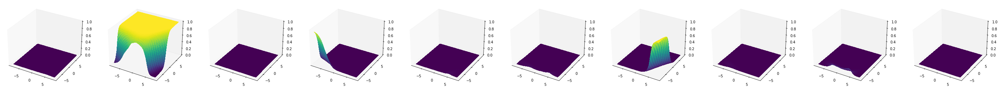

In [82]:
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net1, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-8, x_max=8, y_min=-8, y_max=8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


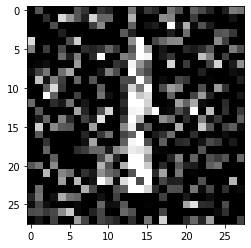

In [83]:
plt.imshow(np.transpose(make_image_grid(ins[outs[:,1].argmin()].reshape(-1,28,28)).numpy(), (1,2,0)))

In [84]:
net1(ins[outs[:,1].argmin()].reshape(-1, 784)).argmax(1)

tensor([6])

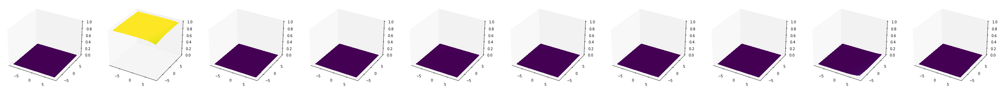

In [87]:
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net2, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-8, x_max=8, y_min=-8, y_max=8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


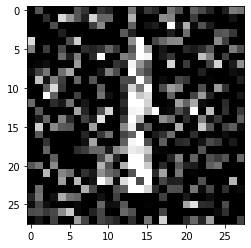

In [88]:
plt.imshow(np.transpose(make_image_grid(ins[outs[:, 1].argmin(0)].reshape(-1,28,28)).numpy(), (1,2,0)))

In [91]:
net2.mode="params"
net2(ins[outs[:,1].argmin()].reshape(-1, 784)).argmax(1)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


tensor([1])

In [79]:

from advertorch.attacks import Attack 
import torch

from rbi.utils.autograd_tools import batch_jacobian 
from rbi.utils.fisher_info import fisher_info

class SpectralKLAttack(Attack):
    def __init__(self, model, eps=0.5, *args, **kwargs):
        self.model = model
        self.eps = eps


    def _get_kl_matrix_eigendecomposition(self, input, output):
        Js = batch_jacobian(self.model.net, input)

        F = fisher_info(output)
        matrix = torch.transpose(Js, dim0=-2, dim1=-1)@F@Js

        eigh = torch.linalg.eigh(matrix)
        return eigh.eigenvalues, eigh.eigenvectors


    def perturb(self, x, y=None, eigendirection=-1):
        if y is None:
            y = self.model(x)
        _, eigvecs = self._get_kl_matrix_eigendecomposition(x, y)
        adversarial_direction = eigvecs[...,eigendirection] * self.eps 
        return x + adversarial_direction

In [80]:
net1.mode="distribution"

In [97]:
attack = SpectralKLAttack(net1, eps=2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


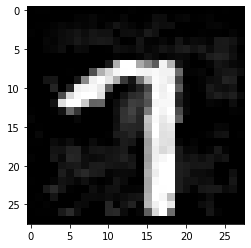

In [98]:
x_pert = attack.perturb(X[3].reshape(-1,784), eigendirection=-1)
plt.imshow(np.transpose(make_image_grid(x_pert.detach().reshape(-1,28,28)).numpy(), (1,2,0)))

In [99]:
net1.net(x_pert).argmax(1)

tensor([8])

In [136]:
eigenvals, eigenvecs = attack._get_kl_matrix_eigendecomposition(X[0].reshape(-1,784), net1(X[0].reshape(-1, 784)))

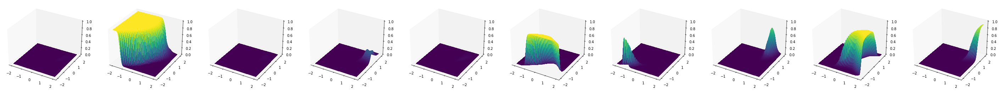

In [137]:
# Most adversarial orthogonal 2d basis
dir1 = eigenvecs[..., -1]
dir2 = eigenvecs[..., -2]
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net1, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-2, x_max=2, y_min=-2, y_max=2)

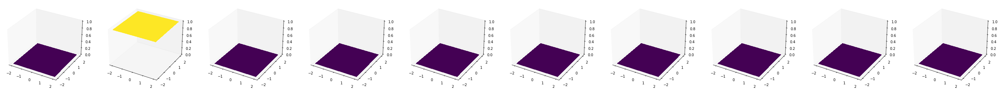

In [138]:
# Least adversarial direction
# Most adversarial orthogonal 2d basis
dir1 = eigenvecs[..., 0]
dir2 = eigenvecs[..., 1]
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net1, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-2, x_max=2, y_min=-2, y_max=2)

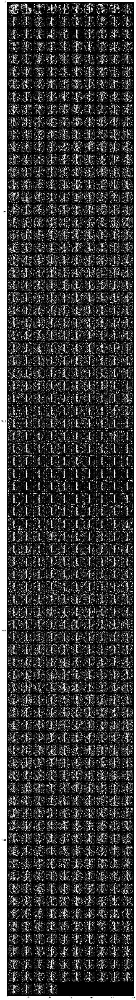

In [139]:
# Visualizing eigendirections
eigen_pictures = []
for i in range(1,785):
    eigen_pictures.append((X[0].reshape(-1,784) + eigenvecs[..., -i]*15).reshape(1, 28, 28))
eigen_pictures = torch.vstack(eigen_pictures).unsqueeze(1).clip(0, 1)

fig = plt.figure(figsize=(20, 100))
plt.imshow(np.transpose(make_image_grid(eigen_pictures, nrow=10).numpy(), (1,2,0)))

In [92]:
net2.mode="rv"

In [140]:
attack = SpectralKLAttack(net2, eps=2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


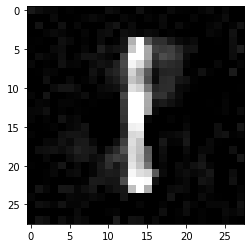

In [141]:
x_pert = attack.perturb(X[0].reshape(-1,784), eigendirection=-1)
plt.imshow(np.transpose(make_image_grid(x_pert.detach().reshape(-1,28,28)).numpy(), (1,2,0)))

In [142]:
net2.net(x_pert).argmax(1)

tensor([8])

In [68]:
eigenvals, eigenvecs = attack._get_kl_matrix_eigendecomposition(X[0].reshape(-1,784), net2(X[0].reshape(-1, 784)))

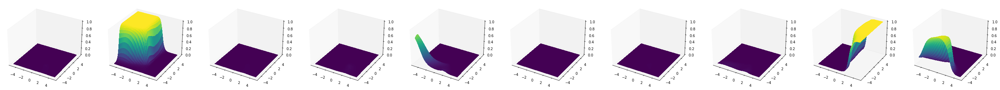

In [69]:
# Most adversarial orthogonal 2d basis
dir1 = eigenvecs[..., -1]
dir2 = eigenvecs[..., -2]
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net2, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-5, x_max=5, y_min=-5, y_max=5)

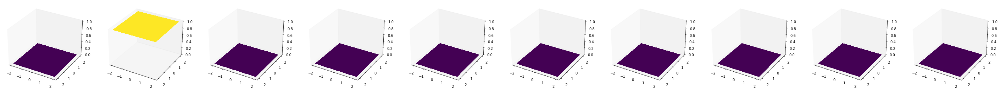

In [70]:
# Least adversarial direction
# Most adversarial orthogonal 2d basis
dir1 = eigenvecs[..., 0]
dir2 = eigenvecs[..., 1]
%matplotlib inline
_, ins, outs = plot_2d_surface_direction(net2, X[0].squeeze(-1).reshape(-1, 784), dir1, dir2, steps=500, x_min=-2, x_max=2, y_min=-2, y_max=2)

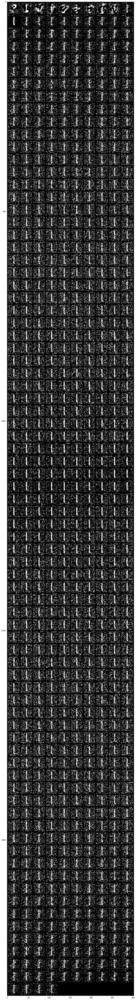

In [131]:
# Visualizing eigendirections
eigen_pictures = []
for i in range(1,785):
    eigen_pictures.append((X[0].reshape(-1,784) + eigenvecs[..., -i]*15).reshape(1, 28, 28))
eigen_pictures = torch.vstack(eigen_pictures).unsqueeze(1).clip(0, 1)

fig = plt.figure(figsize=(20, 100))
plt.imshow(np.transpose(make_image_grid(eigen_pictures, nrow=10).numpy(), (1,2,0)))

In [74]:
from rbi.attacks.advertorch_attack import LinfPGDAttack
from rbi.loss.loss_fn import ForwardKLLoss

loss_fn = ForwardKLLoss()
attack = LinfPGDAttack(net2, loss_fn, 0.2, nb_iter=1000)

In [75]:
X_perturbed = attack.perturb(X)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


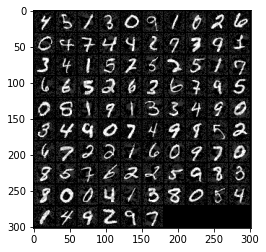

In [76]:
plt.imshow(np.transpose(make_image_grid(X_perturbed.reshape(-1, 1, 28, 28), nrow=10).numpy(), (1,2,0)))

In [77]:
net2.predict(X_perturbed)

tensor([4, 3, 7, 8, 0, 3, 1, 8, 2, 6, 5, 7, 7, 9, 8, 8, 9, 7, 7, 5, 3, 4, 1, 3,
        7, 3, 7, 3, 7, 9, 4, 2, 3, 3, 0, 2, 8, 3, 4, 5, 0, 5, 9, 7, 9, 5, 5, 4,
        8, 9, 8, 4, 4, 0, 7, 4, 9, 9, 5, 2, 4, 9, 2, 3, 7, 0, 5, 9, 3, 2, 3, 0,
        3, 8, 3, 4, 8, 9, 3, 0, 3, 0, 7, 9, 2, 5, 3, 0, 8, 9, 8, 4, 4, 2, 9, 3])

In [104]:
defense = GaussianNoiseJacobiRegularizer(net2, NLLLoss(net2), 0.5)
F = defense._compute_fisher(X, net2(X))
diag_Fisher = torch.diagonal(F,dim1=-2, dim2=-1)
#diag_Fisher = diag_Fisher/diag_Fisher.max(-1).values.unsqueeze(-1)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


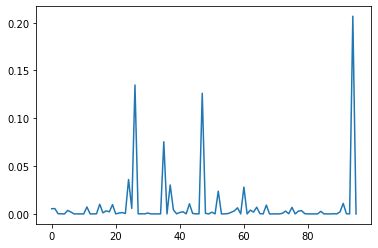

In [108]:
_ = plt.plot(diag_Fisher.detach().max(-1).values)

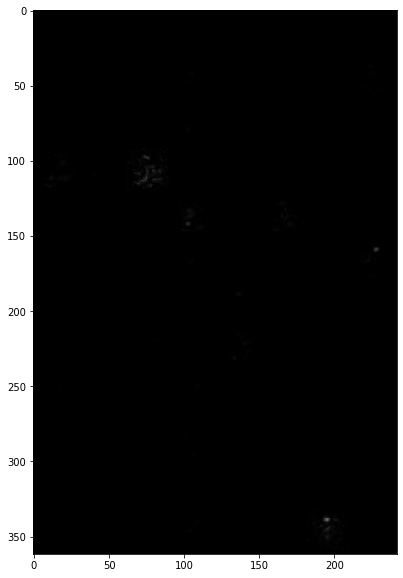

In [109]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(make_image_grid(2*diag_Fisher.detach().reshape(-1,1,28,28)).numpy(), (1,2,0)))

In [110]:
defense = GaussianNoiseJacobiRegularizer(net2, NLLLoss(net2), 0.5)
F = defense._compute_fisher(X_perturbed, net1(X_perturbed))
diag_Fisher = torch.diagonal(F,dim1=-2, dim2=-1)
#diag_Fisher = diag_Fisher/diag_Fisher.max(-1).values.unsqueeze(-1)

c:\ProgramData\Miniconda3\lib\site-packages\torch\nn\modules\container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


(0.0, 100000.0)

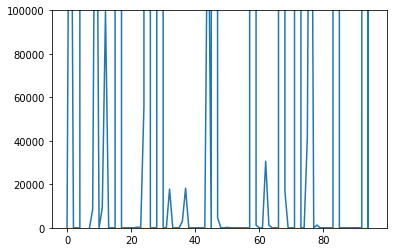

In [114]:
_ = plt.plot(diag_Fisher.detach().max(-1).values)
plt.ylim(0, 100000)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


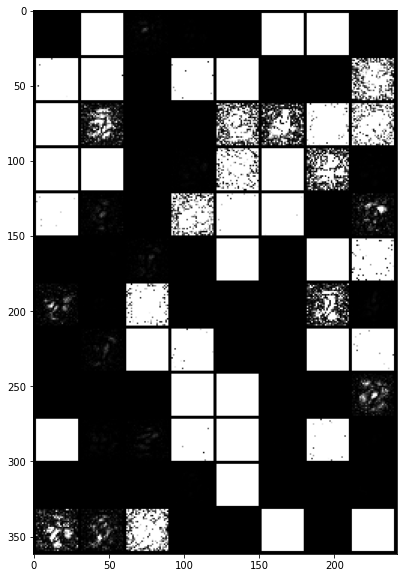

In [98]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(make_image_grid(2*diag_Fisher.detach().reshape(-1,1,28,28)).numpy(), (1,2,0)))